In [2]:
import os
import numpy as np
from tqdm import tqdm
from scipy.stats import norm
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False

In [3]:
colors = [
    "#92c5de",
    "#4393c3",
    "#d6604d",
    "#f4a582",
    "#b2182b",
    "#2166ac"
]

styles = [
    {"style": "--", "marker": "o"},
    {"style": "--", "marker": "s"},
    {"style": "--", "marker": "^"},
    {"style": "--", "marker": "v"},
    {"style": "--", "marker": "*"},
    {"style": "--", "marker": "D"},
]

def plot_statistics(stats_list, ground_truth, h_list, methods, name, style_list = styles, color_dic = colors, std2 = None):
    data_list = stats_list-ground_truth
    MSE_list = np.zeros((len(h_list), len(methods)))
    Biassq_list = np.zeros((len(h_list), len(methods)))
    Var_list = np.zeros((len(h_list), len(methods)))
    for index, h in enumerate(h_list): # stepsize
        data = data_list[index]
        for index2, estimator in enumerate(data): # methods
            MSE_list[index, index2] = np.mean((estimator) ** 2)
            Biassq_list[index, index2] = np.mean(estimator) ** 2
            Var_list[index, index2] = np.var(estimator)
                
    plt.figure(figsize=(18,4), dpi=300)
    plt.subplot(1,3,1)
    for index, stats in enumerate(MSE_list.T): 
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"], 
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel('MSE', fontsize=16)
    # plt.title('MSE', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.subplot(1,3,2)
    for index, stats in enumerate(Biassq_list.T): 
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    if std2:
        plt.axhline(y=std2, color='r', linestyle='--', label='Threshold')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel(r'Bias$^2$', fontsize=16)
    # plt.title(r'Bias$^2$', fontsize=16)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

    plt.subplot(1,3,3)
    for index, stats in enumerate(Var_list.T):
        plt.plot(h_list, stats, label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.xlabel('h', fontsize=16)
    plt.yscale('log')
    plt.ylabel('Var', fontsize=16)
    # plt.title('Var', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=14)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    # plt.rcParams['text.usetex'] = True
    plt.suptitle(name, y=1., fontsize=18)
    plt.show()
    return

In [4]:
def generate_gmm_samples(n_samples, means, weights, covs):
    K = len(weights)
    d = means[0].shape[0]
    samples = []

    for _ in range(n_samples):
        k = np.random.choice(K, p=weights)
        x = np.random.multivariate_normal(mean=means[k], cov=covs[k])
        samples.append(x)

    samples = np.array(samples).T  # shape: (d, n_samples)
    return samples

def compute_gmm_statistics(means, covs, weights, n_samples = 10000):
    stat1 = expected_l1_norm_approx(means, covs, weights)
    stat2 = expected_l2_squared(means, covs, weights)
    stat5 = prob_xj_greater_than_a(1, 0, means, covs, weights)
    stat6 = prob_xj_greater_than_a(0, 20, means, covs, weights)
    stat7 = prob_xj_greater_than_a(0, 0, means, covs, weights)
    stat8 = prob_xj_greater_than_a(0, -20, means, covs, weights)
    stat3_, stat4_ = [], []
    for i in tqdm(range(100)):
        Y = generate_gmm_samples(n_samples, means, weights, covs)
        stat3_.append(np.mean(np.max(np.abs(Y), axis=0)))
        stat4_.append(np.mean(np.max(Y, axis=0)))
    stat3, stat4 = np.mean(stat3_), np.mean(stat4_)
    var3, var4 = np.var(stat3_), np.var(stat4_)
    return np.array([stat1, stat2, stat3, stat4, stat5, stat6, stat7, stat8]), np.array([0, 0, var3, var4, 0, 0, 0, 0])

def expected_l2_squared(means, covs, weights):
    return sum(w * (np.trace(Sigma) + np.dot(mu, mu)) for mu, Sigma, w in zip(means, covs, weights))

def expected_l1_norm_approx(means, covs, weights):
    d = means[0].shape[0]
    E_abs = np.zeros(d)
    for k, (mu, Sigma, w) in enumerate(zip(means, covs, weights)):
        for j in range(d):
            mu_j = mu[j]
            sigma_j = np.sqrt(Sigma[j, j])
            E_abs[j] += w * (mu_j * (2 * norm.cdf(mu_j / sigma_j) - 1) + 
                             sigma_j * np.sqrt(2 / np.pi) * np.exp(-0.5 * (mu_j / sigma_j) ** 2))
    return np.sum(E_abs)

def prob_xj_greater_than_a(j, a, means, covs, weights):
    return sum(w * norm.sf((a - mu[j]) / np.sqrt(Sigma[j, j])) for mu, Sigma, w in zip(means, covs, weights))

In [5]:
### pre-processing data
def preprocessing(path, K, M, h_list):
    data = []
    for i, h in enumerate(h_list):
        filename = f'statsY_list_K{K}_M{M}_h{h}.npy'
        data_i = np.load(os.path.join(path, filename), allow_pickle=True)
        data.append(data_i)
    data = np.array(data)[:, [0, 2, 3, 4, 5, 6], :, :, :] #remove reversible perturbation
    print('each statistics shape: ', data.shape) # (10 step sizes, 6 methods, 128 repeated chains, 10 subchains, 8 statistics)
    
    result = [None] * 8
    result[0] = np.mean(data[:,:,:,:,0], axis=3)
    result[1] = np.mean(data[:,:,:,:,1], axis=3)
    result[2] = np.mean(data[:,:,:,:,2], axis=3)
    result[3] = np.mean(data[:,:,:,:,3], axis=3)
    result[4] = np.mean(data[:,:,:,:,4], axis=3)
    result[5] = np.mean(data[:,:,:,:,5], axis=3)
    result[6] = np.mean(data[:,:,:,:,6], axis=3)
    result[7] = np.mean(data[:,:,:,:,7], axis=3)
    print('each statistics (averaged) shape: ', result[0].shape)
    return result


In [73]:
### parameter setting
means = [np.array([-30, -0, -0]), np.array([-15, 0, 0]), np.array([0, -0, 0]), np.array([15, 0, 0]), np.array([30, -0, -0])]
weights = [0.3, 0.1, 0.2, 0.1, 0.3]
covs = [
    np.array([[5, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[10, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[5, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[10, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[5, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]])
]

In [35]:
### compute or estimate ground truth
n_samples = 1000

stats, stats_var = compute_gmm_statistics(means, covs, weights, n_samples)
name = [r'$\|x\|_1$', r'$\|x\|_2^2$', r'$\max(\mathrm{abs}(X))$', '$\max(X)$', 'P(X[1]>0)', 'P(X[0]>20)', 'P(X[0]>0)', 'P(X[0]>-20)']
print("Computed GMM Statistics:")
for i, (val, var) in enumerate(zip(stats, stats_var)):
    print(f"  {name[i]}: {val:.4f}, var {var:.4f}")

100%|██████████| 100/100 [00:23<00:00,  4.34it/s]

Computed GMM Statistics:
  $\|x\|_1$: 17.5116, var 0.0000
  $\|x\|_2^2$: 348.8000, var 0.0000
  $\max(\mathrm{abs}(X))$: 16.3753, var 0.0606
  $\max(X)$: 8.3176, var 0.0875
  P(X[1]>0): 0.5000, var 0.0000
  P(X[0]>20): 0.2733, var 0.0000
  P(X[0]>0): 0.5000, var 0.0000
  P(X[0]>-20): 0.7267, var 0.0000


In [48]:
### loading data

# load 8 statistics from storage, nonadaptive
h_list = [0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
K = 100000
M = 128
path = f'results/Jul_30_K_{K}/'
data = preprocessing(path, K, M, h_list)
print('methods: ', methods)
print('stats name: ', name)

each statistics shape:  (9, 6, 128, 10, 8)
each statistics (averaged) shape:  (9, 6, 128)
methods:  ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
stats name:  ['$\\|x\\|_1$', '$\\|x\\|_2^2$', '$\\max(\\mathrm{abs}(X))$', '$\\max(X)$', 'P(X[1]>0)', 'P(X[0]>20)', 'P(X[0]>0)', 'P(X[0]>-20)']


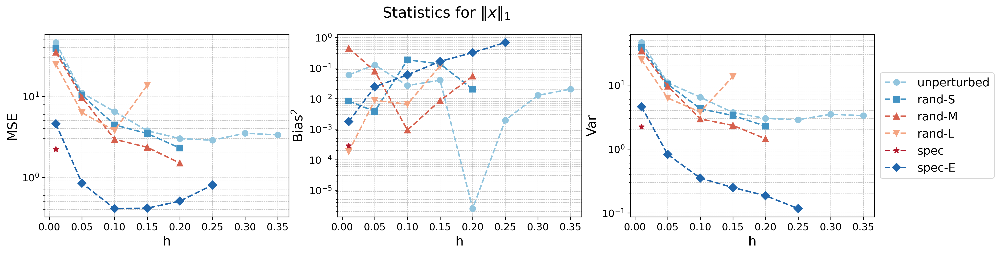

In [37]:
### plot statistics
title = r'Statistics for ' + name[0]
firstmoment_abs_list = data[0].copy()
firstmoment_abs_list[firstmoment_abs_list > 130] = np.nan
plot_statistics(firstmoment_abs_list, stats[0], h_list, methods, title)

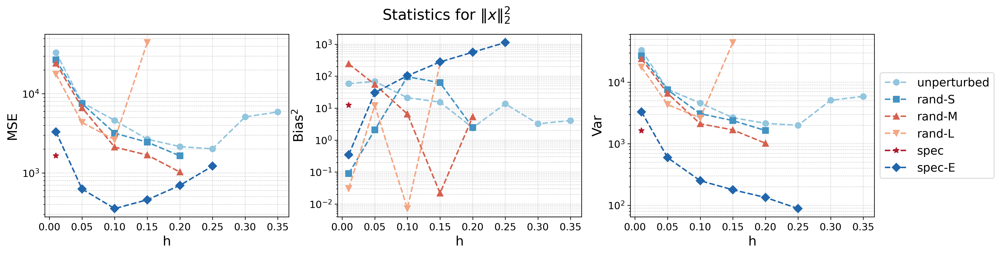

In [150]:
index = 1
title = r'Statistics for ' + name[index]
secondmoment_list = data[index].copy()
secondmoment_list[secondmoment_list > 9000] = np.nan
plot_statistics(secondmoment_list, stats[index], h_list, methods, title)

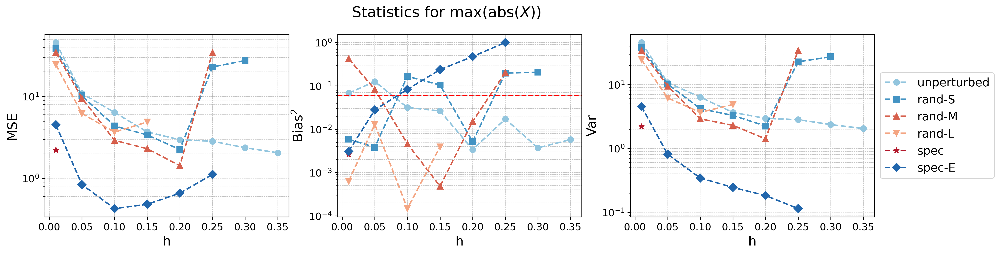

In [38]:
index = 2
title = r'Statistics for ' + name[index]
maxabs_list = data[index].copy()
maxabs_list[maxabs_list > 100] = np.nan
plot_statistics(maxabs_list, stats[index], h_list, methods, title, std2 = stats_var[index])

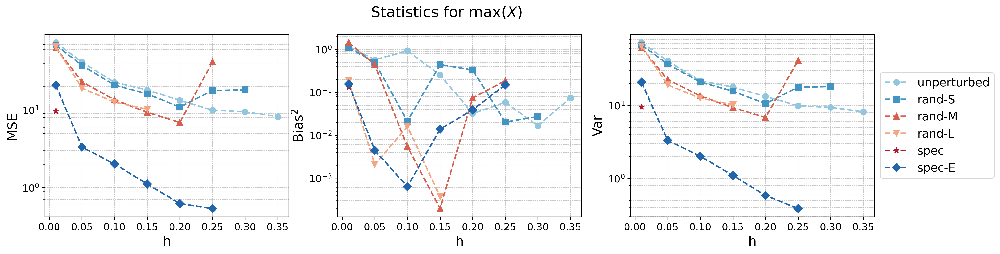

In [39]:
index = 3
title = r'Statistics for ' + name[index]
max_list = data[index].copy()
max_list[max_list > 100] = np.nan
plot_statistics(max_list, stats[index], h_list, methods, title)

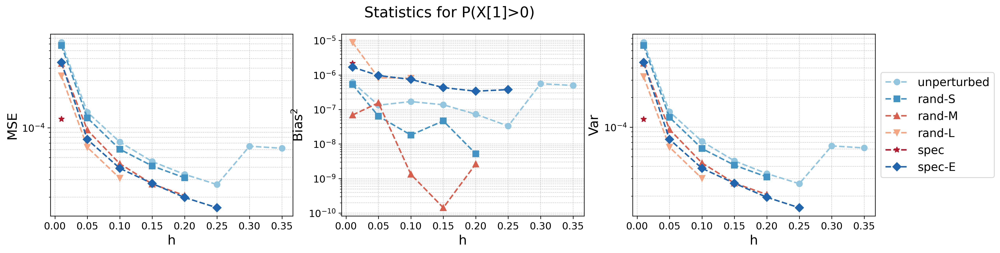

In [106]:
index = 4
title = r'Statistics for ' + name[index]
x1_ge_0 = data[index].copy()
x1_ge_0[(x1_ge_0 > 0.6) | (x1_ge_0 < 0.4)] = np.nan
plot_statistics(x1_ge_0, stats[index], h_list, methods, title)

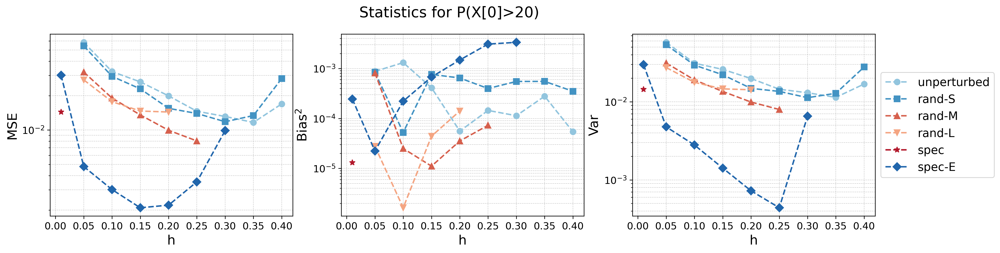

In [109]:
index = 5
title = r'Statistics for ' + name[index]
x_0_ge_20 = data[index].copy()
x_0_ge_20[x_0_ge_20 > 0.9] = np.nan
plot_statistics(x_0_ge_20, stats[index], h_list, methods, title)

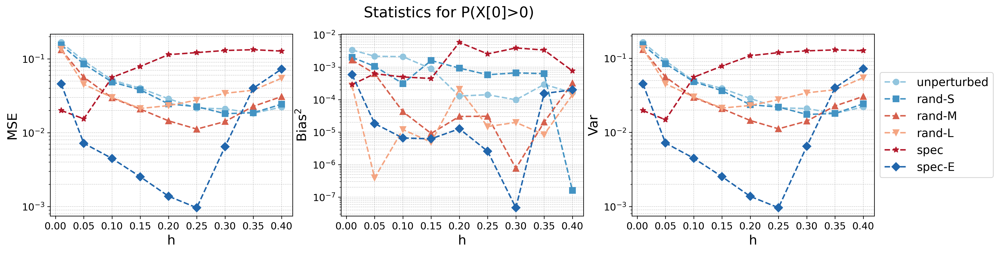

In [120]:
index = 6
title = r'Statistics for ' + name[index]
x0_ge_0 = data[index].copy()
# x0_ge_0[(x0_ge_0 > 0.9) | (x0_ge_0 < 0.1)] = np.nan
plot_statistics(x0_ge_0, stats[index], h_list, methods, title)

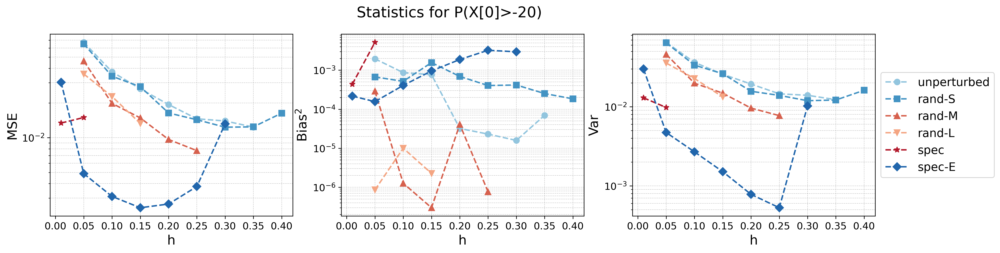

In [118]:
index = 7
title = r'Statistics for ' + name[index]
x_0_ge_neg20 = data[index].copy()
x_0_ge_neg20[x_0_ge_neg20 < 0.1] = np.nan
plot_statistics(x_0_ge_neg20, stats[index], h_list, methods, title)

# fix budget

In [7]:
### parameter setting
means = [np.array([-30, -0, -0]), np.array([-15, 0, 0]), np.array([0, -0, 0]), np.array([15, 0, 0]), np.array([30, -0, -0])]
weights = [0.3, 0.1, 0.2, 0.1, 0.3]
covs = [
    np.array([[5, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[10, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[5, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[10, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]]),
    np.array([[5, 0, 0], 
            [0, 1, 1/5], 
            [0, 1/5, 1/5]])
]

In [9]:
### compute or estimate ground truth
n_samples = 1000

name = [r'$\|x\|_1$', r'$\|x\|_2^2$', r'$\max(\mathrm{abs}(X))$', '$\max(X)$', 'P(X[1]>0)', 'P(X[0]>20)', 'P(X[0]>0)', 'P(X[0]>-20)']
stats, stats_var = compute_gmm_statistics(means, covs, weights, n_samples)
print("Computed GMM Statistics:")
for i, (val, var) in enumerate(zip(stats, stats_var)):
    print(f"  {name[i]}: {val:.4f}, var {var:.4f}")

100%|██████████| 100/100 [00:22<00:00,  4.35it/s]

Computed GMM Statistics:
  $\|x\|_1$: 22.5115, var 0.0000
  $\|x\|_2^2$: 592.2000, var 0.0000
  $\max(\mathrm{abs}(X))$: 21.3593, var 0.1456
  $\max(X)$: 10.9402, var 0.1928
  P(X[1]>0): 0.5000, var 0.0000
  P(X[0]>20): 0.3057, var 0.0000
  P(X[0]>0): 0.5000, var 0.0000
  P(X[0]>-20): 0.6943, var 0.0000


In [10]:
# load 8 statistics from storage, nonadaptive
data = []
name = [r'$\|x\|_1$', r'$\|x\|_2^2$', r'$\max(\mathrm{abs}(X))$', '$\max(X)$', 'P(X[1]>0)', 'P(X[0]>20)', 'P(X[0]>0)', 'P(X[0]>-20)']

# load 8 statistics from storage, nonadaptive
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
h_list = [0.01, 0.02, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
# h_list = [0.01, 0.02, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
K = 200000
M = 128
path = f'results/Jun_16_K_{K}/'
for i, h in enumerate(h_list):
    filename = f'statsY_list_K{K}_M{M}_h{h}.npy'
    data_i = np.load(os.path.join(path, filename), allow_pickle=True)
    data.append(data_i)
data = np.array(data)[:, [0, 2, 3, 4, 5, 6], :, :, :]
print(data.shape)
print(data[0].shape) # (10 step sizes, 6 methods, 128 repeated chains, 10 subchains, 8 statistics)

(10, 6, 128, 10, 8)
(6, 128, 10, 8)


In [11]:
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3).copy()
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3).copy()
print(firstmoment_abs_list.shape)
max_abs_list = np.mean(data[:,:,:,:,2], axis=3).copy()
max_list = np.mean(data[:,:,:,:,3], axis=3).copy()
PX1_list = np.mean(data[:,:,:,:,4], axis=3).copy()
PX0_gt20_list = np.mean(data[:,:,:,:,5], axis=3).copy()
PX0_gt0_list = np.mean(data[:,:,:,:,6], axis=3).copy()
PX0_gt_20_list = np.mean(data[:,:,:,:,7], axis=3).copy()

(10, 6, 128)


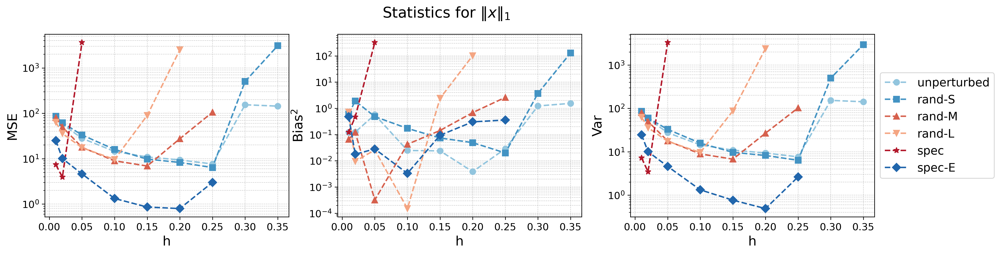

In [12]:
name = r'Statistics for $\|x\|_1$'
firstmoment_abs_list[firstmoment_abs_list > 500] = np.nan
plot_statistics(firstmoment_abs_list, stats[0], h_list, methods, name)

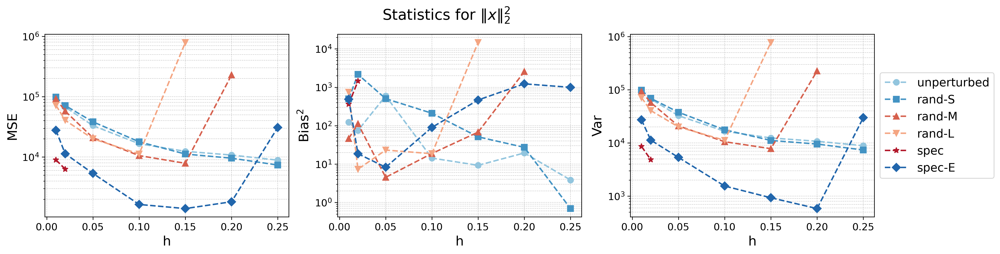

In [13]:
name = r'Statistics for $\|x\|^2_2$'
secondmoment_list[secondmoment_list > 10000] = np.nan
plot_statistics(secondmoment_list, stats[1], h_list, methods, name)

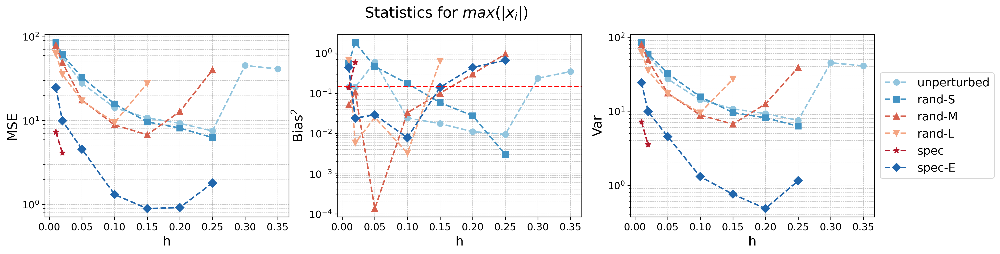

In [14]:
name = r'Statistics for $max(|x_i|)$'
max_abs_list[max_abs_list > 100] = np.nan 
plot_statistics(max_abs_list, stats[2], h_list, methods, name, std2 = stats_var[2])

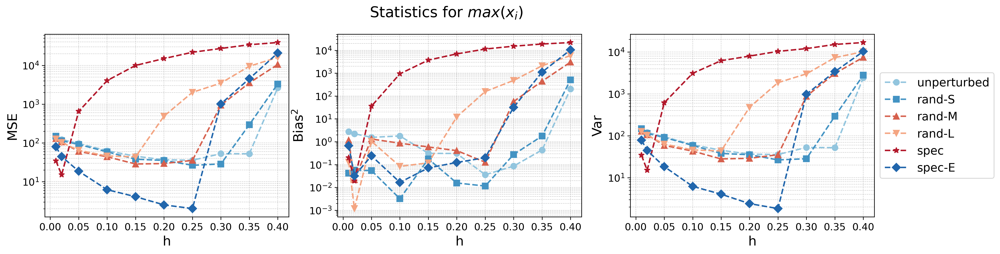

In [15]:
name = r'Statistics for $max(x_i)$'
# max_list[max_list > 100] = np.nan
plot_statistics(max_list, stats[3], h_list, methods, name)

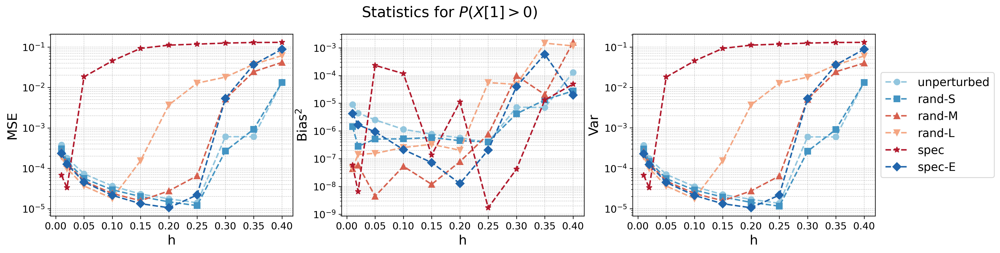

In [16]:
name = r'Statistics for $P(X[1]>0)$'
# max_list[max_list > 100] = np.nan
plot_statistics(PX1_list, stats[4], h_list, methods, name)

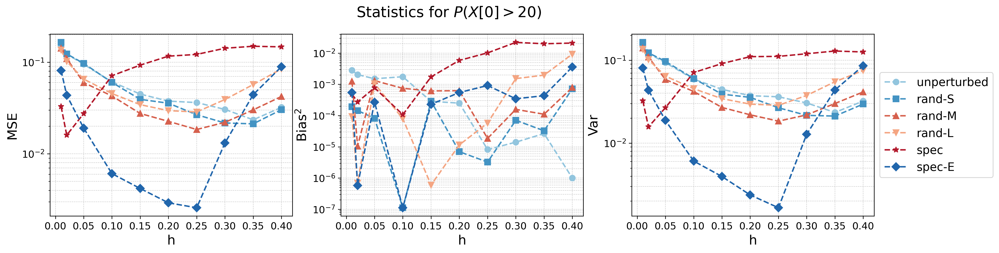

In [17]:
name = r'Statistics for $P(X[0]>20)$'
# max_list[max_list > 100] = np.nan
plot_statistics(PX0_gt20_list, stats[5], h_list, methods, name)

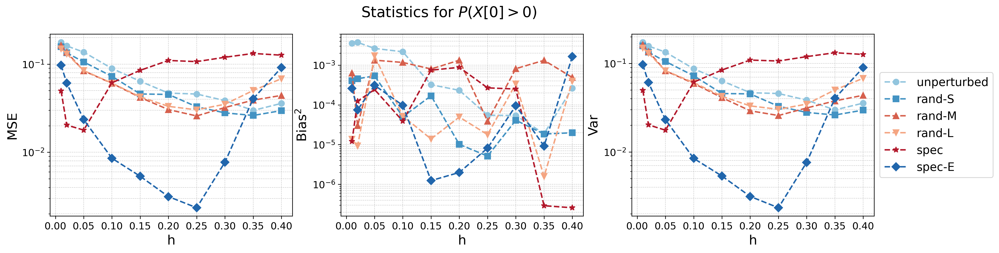

In [18]:
name = r'Statistics for $P(X[0]>0)$'
# max_list[max_list > 100] = np.nan
plot_statistics(PX0_gt0_list, stats[6], h_list, methods, name)

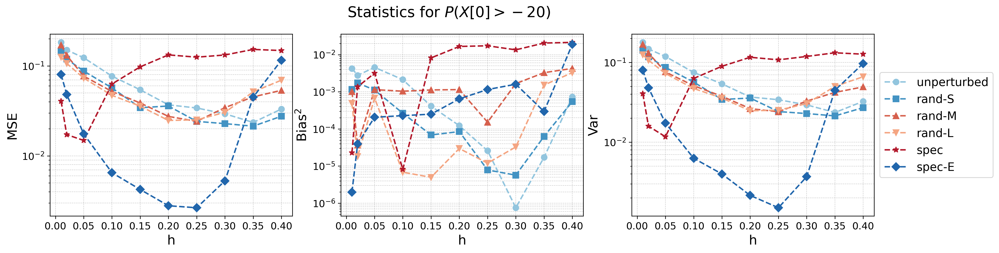

In [19]:
name = r'Statistics for $P(X[0]>-20)$'
# max_list[max_list > 100] = np.nan
plot_statistics(PX0_gt_20_list, stats[7], h_list, methods, name)

# fix time

In [51]:
# load 8 statistics from storage, nonadaptive
data = []
T = 10000
M = 128
path = f'results/Jun_16_T_{T}/'
for i, h in enumerate(h_list):
    filename = f'statsY_list_T{T}_M{M}_h{h}.npy'
    data_i = np.load(os.path.join(path, filename), allow_pickle=True)
    data.append(data_i)
data = np.array(data)[:, [0, 2, 3, 4, 5, 6], :, :, :]
print(data.shape)
print(data[0].shape)

(9, 6, 128, 10, 8)
(6, 128, 10, 8)


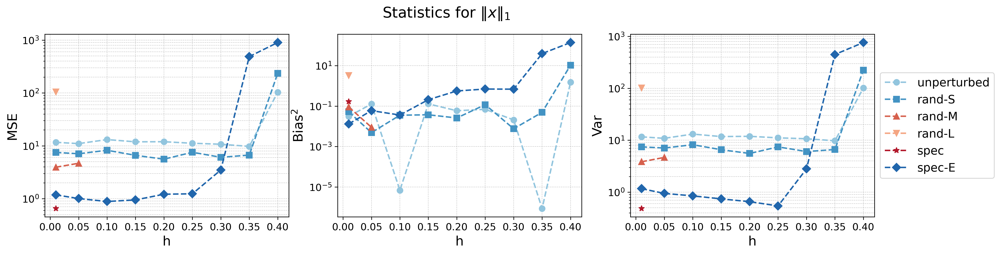

In [202]:
name = r'Statistics for $\|x\|_1$'
firstmoment_abs_list = np.mean(data[:,:,:,:,0], axis=3).copy()
firstmoment_abs_list[firstmoment_abs_list > 190] = np.nan
plot_statistics(firstmoment_abs_list, stats[0], h_list, methods, name)

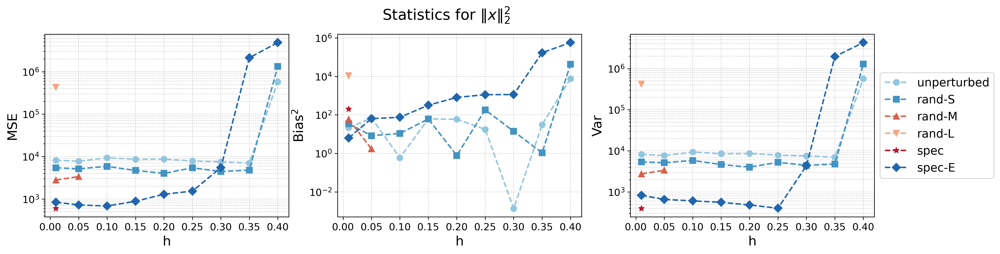

In [201]:
name = r'Statistics for $\|x\|^2_2$'
secondmoment_list = np.mean(data[:,:,:,:,1], axis=3).copy()
secondmoment_list[secondmoment_list > 16000] = np.nan
plot_statistics(secondmoment_list, stats[1], h_list, methods, name)

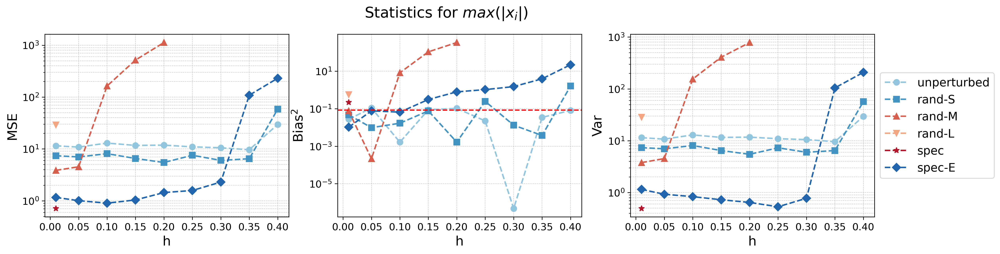

In [191]:
name = r'Statistics for $max(|x_i|)$'
max_abs_list = np.mean(data[:,:,:,:,2], axis=3).copy()
max_abs_list[max_abs_list > 120] = np.nan
plot_statistics(max_abs_list, stats[2], h_list, methods, name, std2=stats_var[2])

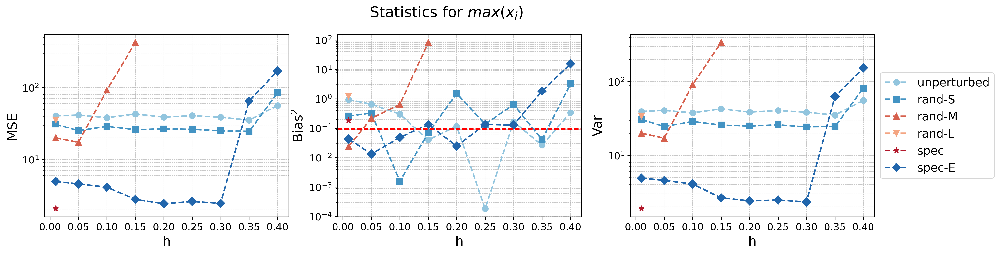

In [195]:
name = r'Statistics for $max(x_i)$'
max_list = np.mean(data[:,:,:,:,3], axis=3).copy()
max_list[max_list > 100] = np.nan
plot_statistics(max_list, stats[3], h_list, methods, name, std2=stats_var[3])

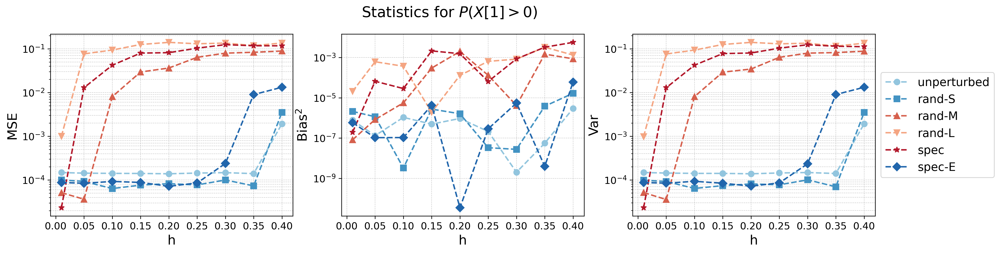

In [186]:
name = r'Statistics for $P(X[1]>0)$'
PX1_list = np.mean(data[:,:,:,:,4], axis=3).copy()
# PX1_list[(PX1_list > 0.9)|(PX1_list < 0.1)] = np.nan
plot_statistics(PX1_list, stats[4], h_list, methods, name)

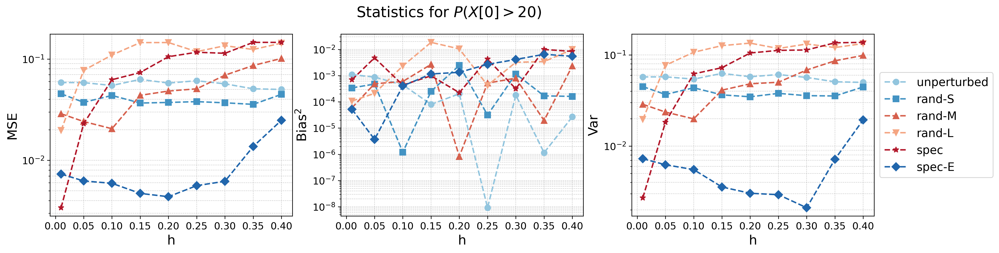

In [183]:
name = r'Statistics for $P(X[0]>20)$'
PX0_gt20_list = np.mean(data[:,:,:,:,5], axis=3).copy()
# PX0_gt20_list[PX0_gt20_list > 0.8] = np.nan
plot_statistics(PX0_gt20_list, stats[5], h_list, methods, name)

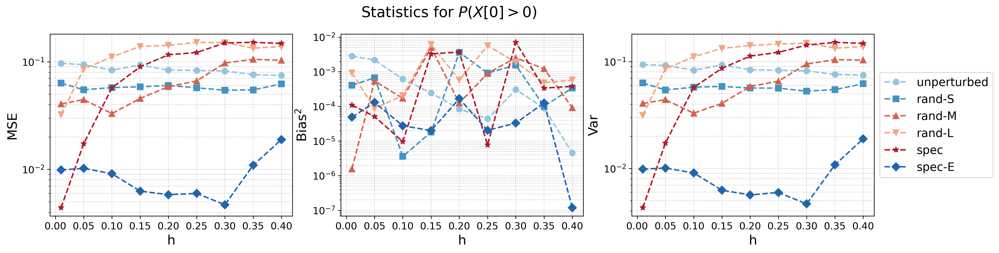

In [184]:
name = r'Statistics for $P(X[0]>0)$'
PX0_gt0_list = np.mean(data[:,:,:,:,6], axis=3).copy()
# PX0_gt0_list[PX0_gt0_list > ] = np.nan
plot_statistics(PX0_gt0_list, stats[6], h_list, methods, name)

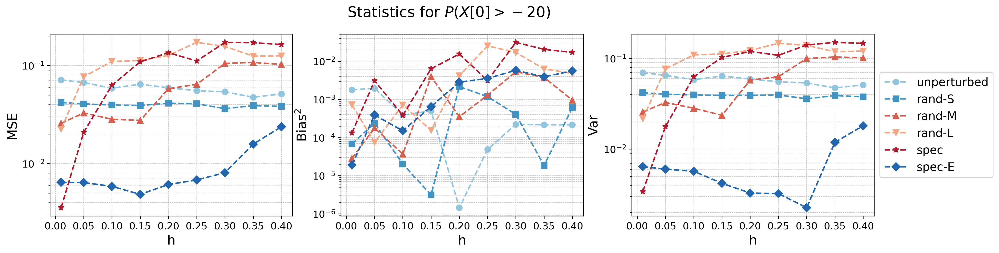

In [185]:
name = r'Statistics for $P(X[0]>-20)$'
PX0_gt_20_list = np.mean(data[:,:,:,:,7], axis=3).copy()
# PX0_gt_20_list[PX0_gt_20_list > 100] = np.nan
plot_statistics(PX0_gt_20_list, stats[7], h_list, methods, name)

# ratio of blowing up chains

In [71]:
def plot_exceeding_summary(estimator1, estimator2, step_sizes, color_dic = colors, style_list = styles, threshold=50):
    """
    Plots two summary plots:
    1. Number of estimators exceeding the threshold across step sizes for each method.
    2. Average value of the estimators that exceed the threshold across step sizes for each method.

    Parameters:
    - estimators: np.ndarray of shape (step_size, method, chain)
    - threshold: float, the cutoff value to check exceedances
    """
    methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']

    num_step_sizes, num_methods, num_chains = estimator1.shape
    assert num_step_sizes == len(step_sizes), "Mismatch in number of step sizes"
    assert num_methods == len(methods), "Mismatch in number of methods"

    # Compute number and average of exceedances
    num_exceed1 = np.sum(estimator1 > threshold, axis=2)  # shape: (step_size, method)
    num_exceed2 = np.sum(estimator2 > threshold, axis=2)  # shape: (step_size, method)

    

    # Plot 1: Number of exceedances
    plt.figure(figsize=(12, 5), dpi=300)
    for index in range(num_methods):
        plt.plot(step_sizes, num_exceed1[:, index], label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.title(rf"Number of $\|x\|_1$ estimator exceeding {threshold}, true value ~22.5", fontsize=18)
    plt.xlabel("Step Size h", fontsize=16)
    plt.ylabel("Count (out of 128 chains)", fontsize=16)
    plt.legend(fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Plot 2: Average value of exceedances
    plt.figure(figsize=(12, 5), dpi=300)
    for index in range(num_methods):
        plt.plot(step_sizes, num_exceed2[:, index], label=methods[index], linestyle=style_list[index]["style"],
         marker=style_list[index]["marker"], color = color_dic[index], linewidth=1.8, markersize=7)
    plt.title(rf"Number of $\max(|X|)$ estimator exceeding {threshold}, true value ~21.4", fontsize=18)
    plt.xlabel("Step Size h", fontsize=16)
    plt.ylabel("Count (out of 128 chains)", fontsize=16)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [57]:
# load 8 statistics from storage, nonadaptive
data = []
name = [r'$\|x\|_1$', r'$\|x\|_2^2$', r'$\max(\mathrm{abs}(X))$', '$\max(X)$', 'P(X[1]>0)', 'P(X[0]>20)', 'P(X[0]>0)', 'P(X[0]>-20)']

# load 8 statistics from storage, nonadaptive
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
h_list = [0.01, 0.02, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
# h_list = [0.01, 0.02, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]
T = 10000
M = 128
path = f'results/Jun_16_T_{T}/'
for i, h in enumerate(h_list):
    filename = f'statsY_list_T{T}_M{M}_h{h}.npy'
    data_i = np.load(os.path.join(path, filename), allow_pickle=True)
    data.append(data_i)
data = np.array(data)[:, [0, 2, 3, 4, 5, 6], :, :, :]
print(data.shape)
print(data[0].shape) # (10 step sizes, 6 methods, 128 repeated chains, 10 subchains, 8 statistics)

(10, 6, 128, 10, 8)
(6, 128, 10, 8)


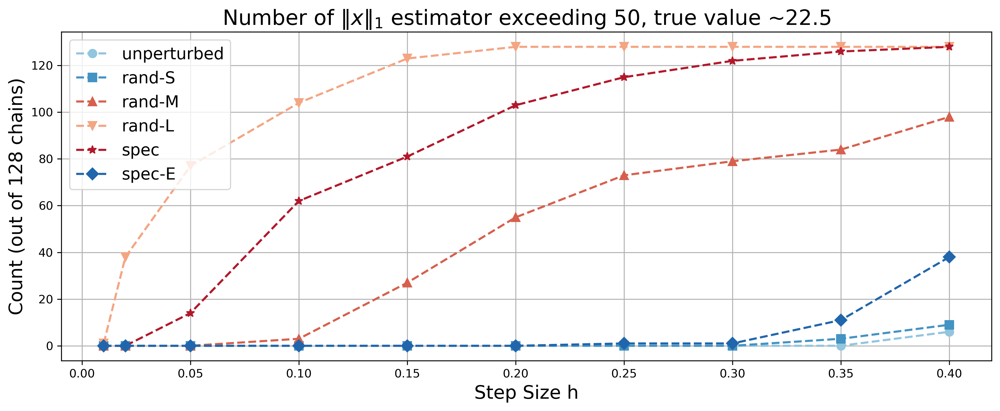

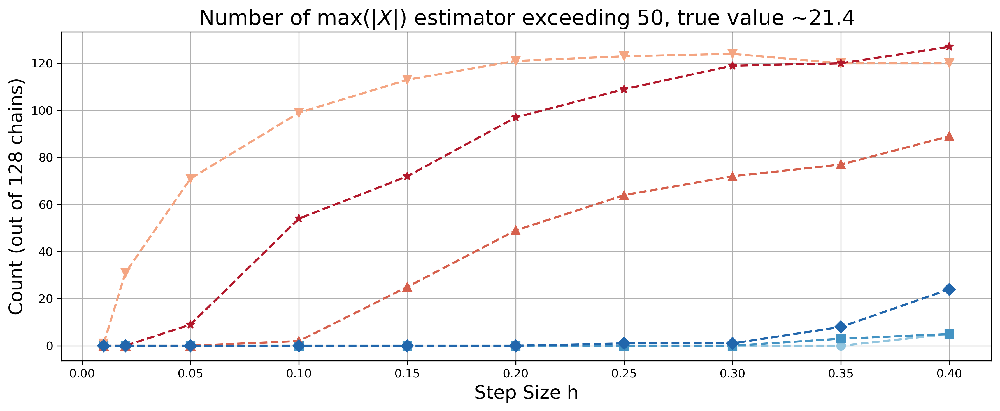

In [72]:
plot_exceeding_summary(np.mean(data[:,:,:,:,0], axis=3), np.mean(data[:,:,:,:,2], axis=3), h_list)

# trajectory histogram

In [74]:
def ground_truth_sample(means, covs, weights, n_samples):
    # Sample from the mixture
    samples = np.vstack([
        np.random.multivariate_normal(mean, cov, int(w * n_samples))
        for mean, cov, w in zip(means, covs, weights)
    ])
    return samples

def compute_quantiles(samples, alpha):
    left_quantile = np.quantile(samples, alpha)
    right_quantile = np.quantile(samples, 1-alpha)
    return left_quantile, right_quantile

In [75]:
K = 200000
true_samples = ground_truth_sample(means, covs, weights, K)[:,0]
l_quantile, r_quantile = compute_quantiles(true_samples, 0.02)
l_quantile, r_quantile

(-33.3472765120586, 33.347055976603016)

In [94]:
methods = ['unperturbed', 'rand-S', 'rand-M', 'rand-L', 'spec', 'spec-E']
colors = ['skyblue', 'salmon', 'lightgreen', 'mediumpurple', 'gold', 'lightcoral', 'lightslategray']

def plot_sample_distributions(method_labels, samples):
    m = len(method_labels)
    assert samples.shape[0] == m, "Mismatch between number of methods and sample rows"

    fig, axes = plt.subplots(m, 1, figsize=(6, 3*m), constrained_layout=True, dpi=300)
    
    if m == 1:
        axes = [axes]  # Ensure axes is always iterable

    for i in range(m):
        ax = axes[i]
        all_samples = np.concatenate([true_samples, samples[i]])
        bins = np.histogram_bin_edges(all_samples, bins=50)
        ax.hist(true_samples, bins=bins, alpha=0.4, edgecolor='gray', color='lightgray', label='True', density=True)
        ax.hist(samples[i], bins=bins, alpha=0.7, edgecolor='black', color='skyblue', label=method_labels[i], density=True)
        ax.set_title(f"{method_labels[i]}", fontsize = 16)
        ax.set_ylabel("Frequency", fontsize = 14)
        if i == m-1:
            ax.set_xlabel("Empirical distribution of X[0]", fontsize = 14)

    plt.show()

def plot_sample_mixing(method_labels, samples, bins=30):
    """
    Plots the sample distributions for each method.

    Parameters:
    - method_labels: list of strings, length m (number of methods)
    - samples: numpy array of shape (m, N), where N is number of samples per method
    - bins: number of histogram bins (default: 30)
    """
    m = len(method_labels)
    assert samples.shape[0] == m, "Mismatch between number of methods and sample rows"

    fig, axes = plt.subplots(m, 1, figsize=(6, 3*m), constrained_layout=True, dpi=300)
    
    if m == 1:
        axes = [axes]  # Ensure axes is always iterable

    for i in range(m):
        ax = axes[i]
        ax.plot(samples[i])
        ax.axhline(y=r_quantile, color='red', linestyle='--', linewidth=1)
        ax.axhline(y=l_quantile, color='red', linestyle='--', linewidth=1)
        ax.set_title(f"{method_labels[i]}", fontsize = 16)
        ax.set_ylabel("x[0]", fontsize = 14)
        if i == m-1:
            ax.set_xlabel("Time step", fontsize = 14)

    plt.show()

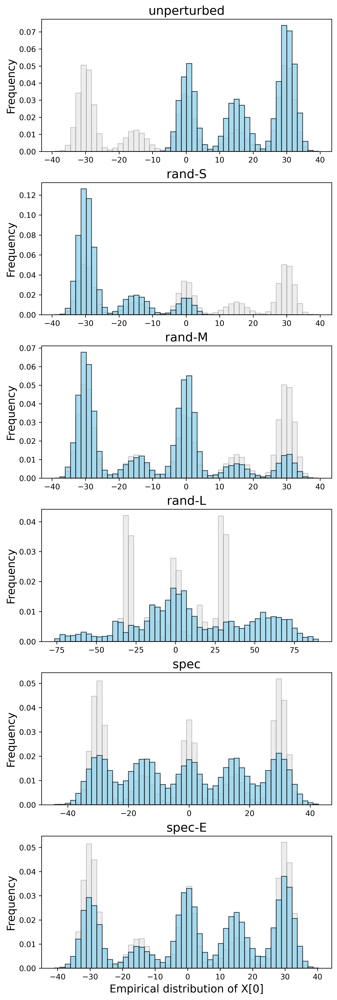

In [95]:
h = 0.25
K = 50000
path = f'results/May_31_K_{K}/traj/'
filename = f'traj_h{h}.npy'
data = np.load(os.path.join(path, filename), allow_pickle=True)
plot_sample_distributions(methods, data[np.r_[0, 2:len(data)], :])

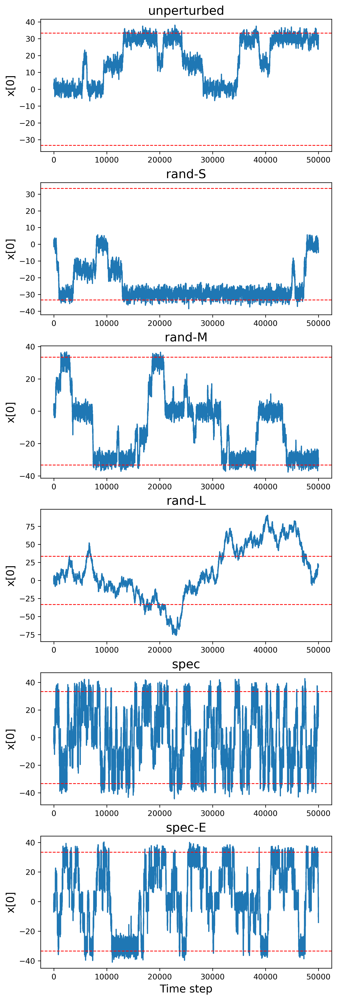

In [96]:
h = 0.25
K = 50000
path = f'results/May_31_K_{K}/traj/'
filename = f'traj_h{h}.npy'
data = np.load(os.path.join(path, filename), allow_pickle=True)
plot_sample_mixing(methods, data[np.r_[0, 2:len(data)], :])